>Note: This was run on Colaboratory, and some symbols might be missing, if viewed in VSCode, or Jupiter.

# Installing the YOLOv5 Environment

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
!pip install -U -r yolov5/requirements.txt  # install dependencies

%cd /content/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 10222, done.
remote: Total 10222 (delta 0), reused 0 (delta 0), pack-reused 10222
Receiving objects: 100% (10222/10222), 10.49 MiB | 11.80 MiB/s, done.
Resolving deltas: 100% (7066/7066), done.
     |████████████████████████████████| 11.2 MB 4.3 MB/s 
     |████████████████████████████████| 15.7 MB 37.3 MB/s 
     |████████████████████████████████| 60.3 MB 1.3 MB/s 
     |████████████████████████████████| 3.1 MB 33.4 MB/s 
     |████████████████████████████████| 596 kB 51.4 MB/s 
     |████████████████████████████████| 62 kB 586 kB/s 
     |████████████████████████████████| 38.1 MB 1.3 MB/s 
     |██████████████████████████████▎ | 834.1 MB 1.4 MB/s eta 0:00:34tcmalloc: large alloc 1147494400 bytes == 0x55f910ece000 @  0x7facb3010615 0x55f8d83e84cc 0x55f8d84c847a 0x55f8d83eb2ed 0x55f8d84dce1d 0x55f8d845ee99 0x55f8d84599ee 0x55f8d83ecbda 0x55f8d845ed00 0x55f8d84599ee 0x55f8d83ecbda 0x55f8d845b737 0x55f8d84ddc66 0x55f8d845adaf 0x55f8d8

/content/yolov5


In [ ]:
import torch
from IPython.display import Image  # for displaying images
from google.colab import drive  # for downloading models/datasets
drive.mount('/content/gdrive')

print('torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Mounted at /content/gdrive
torch 1.10.0+cu111 CPU


# Download Custom YOLOv5 Object Detection Data

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="lUWb1DSogkb1SWcE7xwU")
project = rf.workspace().project("flame-annotation-2sttq")
dataset = project.version(2).download("yolov5")

     |████████████████████████████████| 145 kB 4.1 MB/s 
     |████████████████████████████████| 178 kB 39.1 MB/s 
     |████████████████████████████████| 1.1 MB 40.8 MB/s 
     |████████████████████████████████| 67 kB 4.9 MB/s 
     |████████████████████████████████| 138 kB 47.6 MB/s 
  Created wheel for roboflow: filename=roboflow-0.2.1-py3-none-any.whl size=20914 sha256=6cc1e0ec11053ca6a641ed9587c5261bb81bbdfdb73a1c27b96b22aa947f514b
  Stored in directory: /root/.cache/pip/wheels/57/00/03/2d83f3e90ff41c36eef9c3747c328290c01b06e2619f9ed7b6
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9672 sha256=886a8ea79a513c86d0ecd453a0b6c558b05c89d73e0de0c07016aeb2ca7c37ca
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
Successfully built roboflow wget
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.0.6
    Uninstalling pyparsing-3.0.6:
      Successfully uninstalled pyparsing-3.0.6
  Att

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Flame-Annotation-2 in yolov5pytorch:: 100%|██████████| 3454/3454 [00:04<00:00, 790.32it/s] 


# Training a pre-designed YOLOv5 Detector

In [ ]:
!python train.py \
        --data Flame-Annotation-2/data.yaml \
        --img 416 \
        --cfg yolov5s.yaml \
        --cache

train: weights=yolov5s.pt, cfg=yolov5s.yaml, data=Flame-Annotation-2/data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=300, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=0, save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-147-g628817d torch 1.10.1+cu102 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0.0, t

# Evaluate pre-designed YOLOv5 Detector Performance

In [ ]:
# %load_ext tensorboard
%tensorboard --logdir runs/train/

<IPython.core.display.Javascript object>

# Visualize YOLOv5 training data

## Training Batch 0

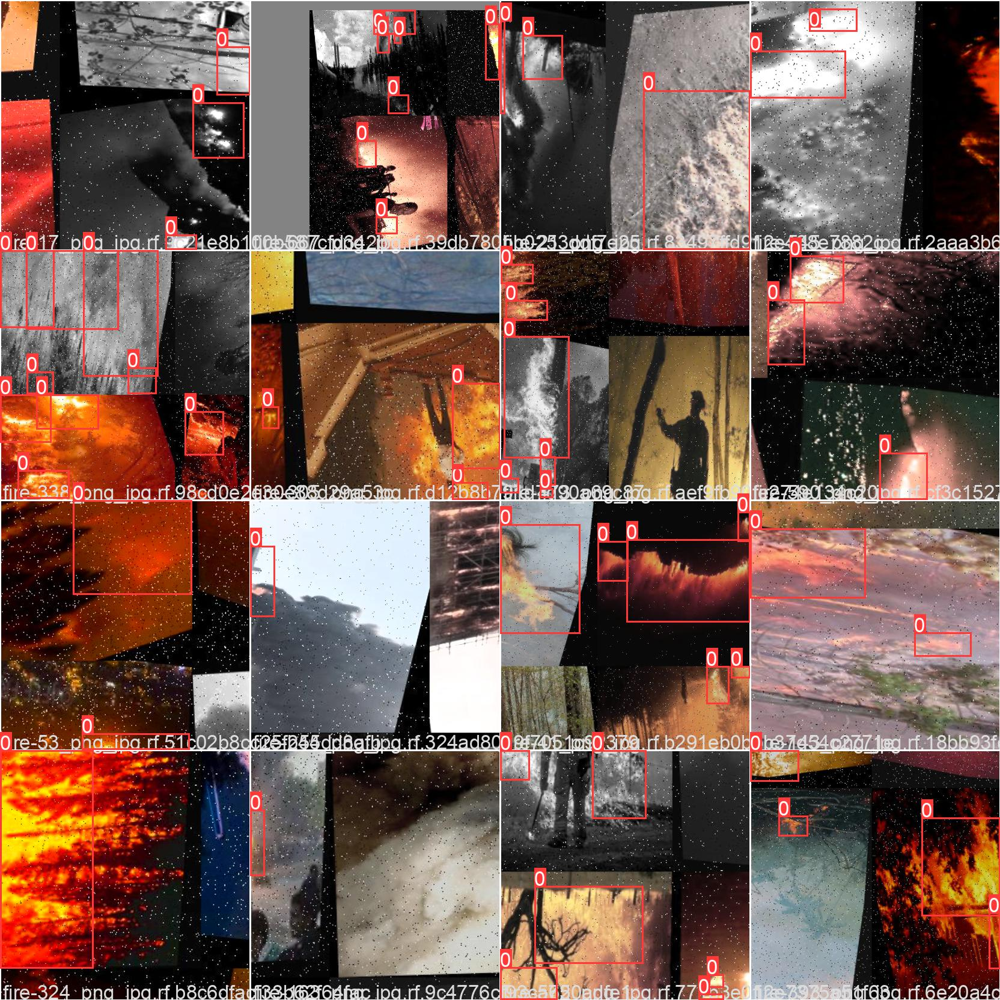

In [ ]:
Image(filename='runs/train/exp/train_batch0.jpg', width=500)

## Training Batch 1

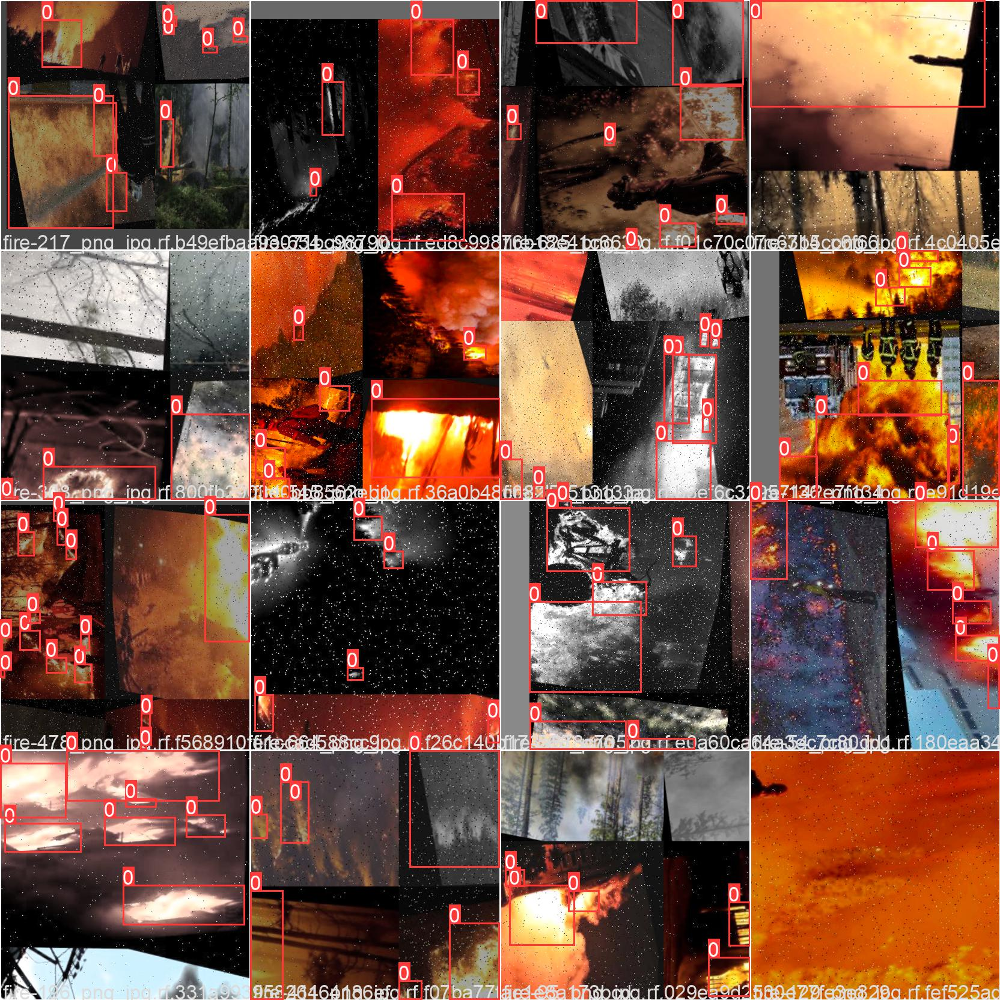

In [ ]:
Image(filename='runs/train/exp/train_batch1.jpg', width=500)

## Training Batch 2

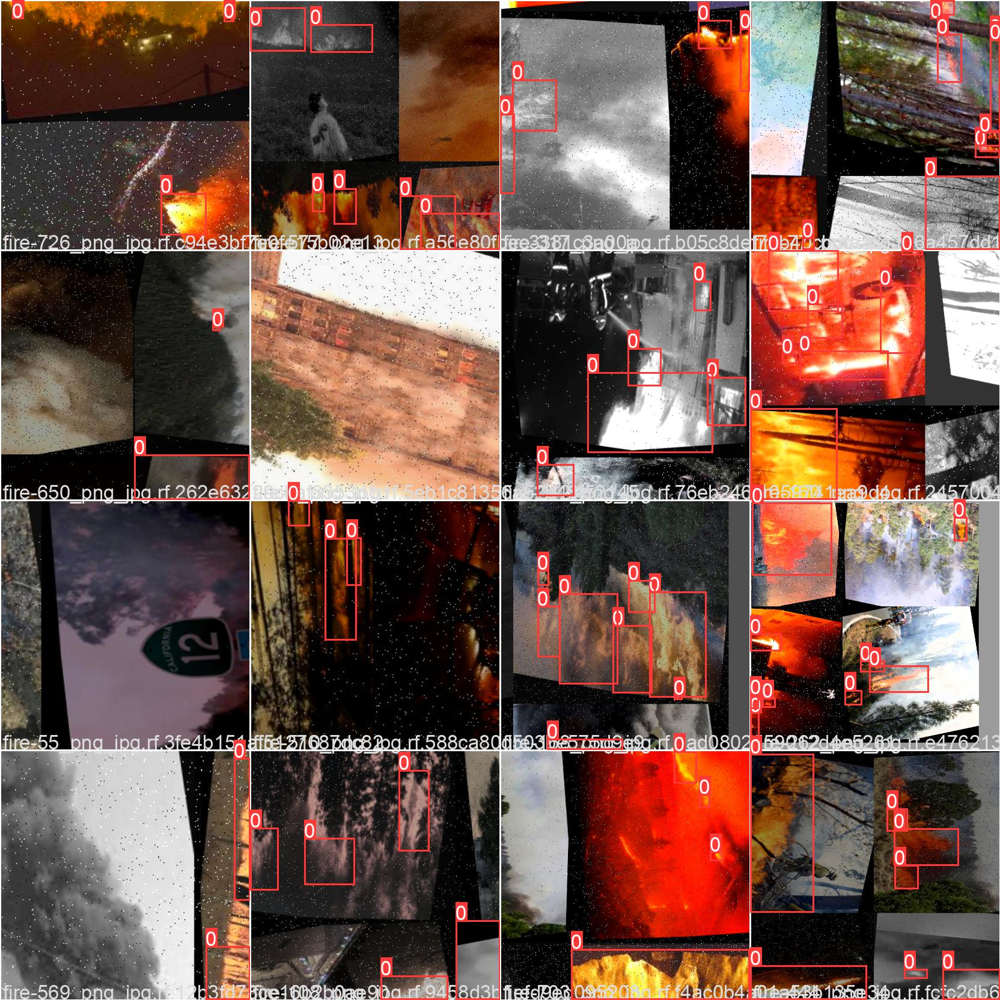

In [ ]:
Image(filename='runs/train/exp/train_batch2.jpg', width=500)

# Run YOLOv5 Inference on Test Images

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.4 --source Flame-Annotation-2/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=Flame-Annotation-2/test/images, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-147-g628817d torch 1.10.1+cu102 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/72 /content/yolov5/Flame-Annotation-2/test/images/fire-107_png_jpg.rf.f5d8177b54bee3f7e922545f45076310.jpg: 416x416 1 Fire, Done. (0.018s)
image 2/72 /content/yolov5/Flame-Annotation-2/test/images/fire-110_png_jpg.rf.6b47bec439cce0937810b80df48350be.jpg: 416x416 1 Fire, Done. (0.018s)
image 3/72 /content/yolov5/Flame-Annotation-2/test/images/fire-111_png_jpg.rf.8b757ff0f119572

## Testing Batch 0

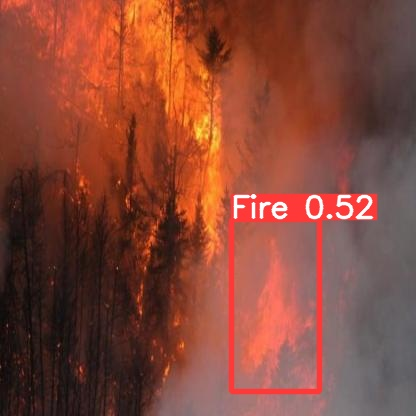

In [ ]:
Image(filename='runs/detect/exp4/fire-107_png_jpg.rf.f5d8177b54bee3f7e922545f45076310.jpg', width=500)

## Testing Batch 1

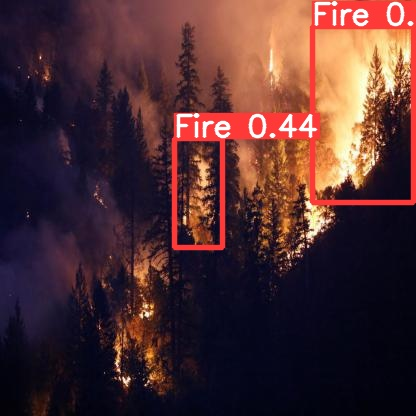

In [ ]:
Image(filename='runs/detect/exp4/fire-152_png_jpg.rf.8f664f0950777bdea417f3dce22d2396.jpg', width=500)

## Testing Batch 2

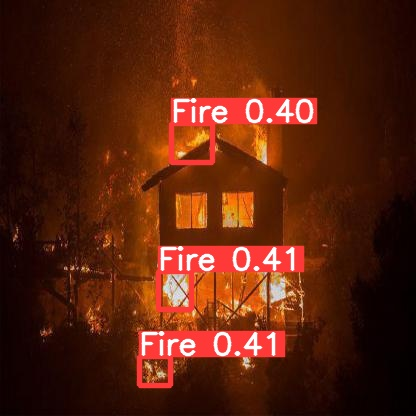

In [ ]:
Image(filename='runs/detect/exp4/fire-537_png_jpg.rf.a6b9a2b412ef4d6fa9aa5103545becb3.jpg', width=500)

# Save the entire model, along with weights and dataset

In [ ]:
!cp -r ../yolov5/ ../gdrive/MyDrive/

# Testing out with device camera

In [ ]:
import torch
!pip install -U -r yolov5/requirements.txt  # install dependencies
model = torch.hub.load('/content/yolov5', 'yolov5s', '/content/yolov5/runs/train/exp/weights/best.pt', source='local')

requirements: PyYAML>=5.3.1 not found and is required by YOLOv5, attempting auto-update...


YOLOv5 🚀 v6.0-147-g628817d torch 1.10.0+cu111 CPU



  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13

requirements: 1 package updated per /content/yolov5/requirements.txt
requirements: ⚠️ Restart runtime or rerun command for updates to take effect



  0%|          | 0.00/14.0M [00:00<?, ?B/s]

Fusing layers... 


Model Summary: 213 layers, 7225885 parameters, 0 gradients
Adding AutoShape... 


In [ ]:
def inputImage(img, size=416):
  g = (size / max(im.size))  # gain
  im = im.resize((int(x * g) for x in im.size), Image.ANTIALIAS)  # resize
  results = model(im)  # inference
  results.render()  # updates results.imgs with boxes and labels
  return Image.fromarray(results.imgs[0])

# Want to reuse the repository? Run this

In [ ]:
!cp -r gdrive/MyDrive/yolov5/ .